## Apache Spark 3 for Data Engineering and Analytics with Python
##### This is the exercises from OREILLY course https://learning.oreilly.com/videos/apache-spark-3/9781803244303/
##### Git repo: https://github.com/PacktPublishing/Apache-Spark-3-for-Data-Engineering-and-Analytics-with-Python

### Chapter 2: Spark Concepts
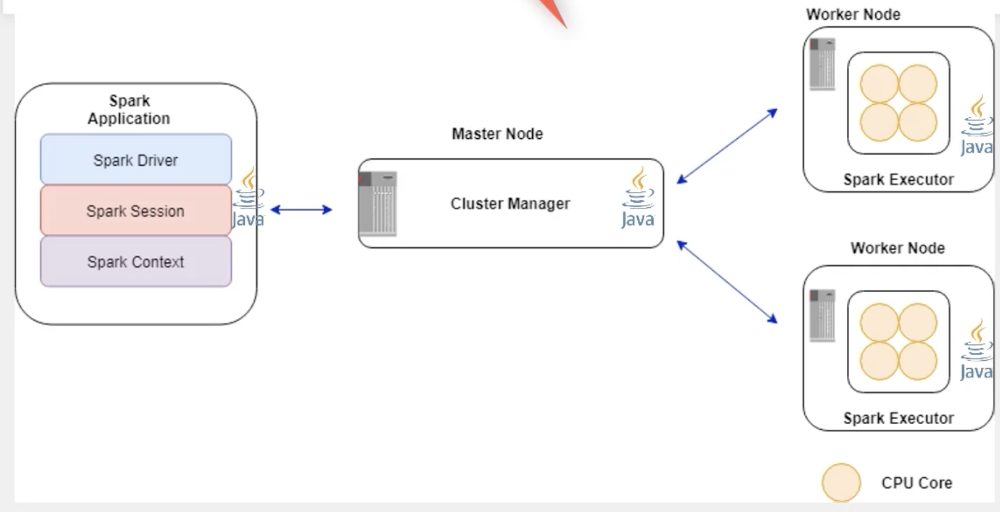

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import count

In [2]:
spark = SparkSession.builder.appName("SparkCourse").getOrCreate()

22/10/30 13:43:03 WARN Utils: Your hostname, HSIANGdeiMac.local resolves to a loopback address: 127.0.0.1; using 192.168.0.152 instead (on interface en1)
22/10/30 13:43:03 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


22/10/30 13:43:03 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
type(spark)

pyspark.sql.session.SparkSession

In [4]:
spdf_sales = spark.read.format('csv').option('inferSchema','true').option('header','true').load('/Users/alex/SourceCode/_Training_Spark/Apache-Spark-3-for-Data-Engineering-and-Analytics-with-Python-/Section 2 Resources/sales_records.csv')
spdf_sales.select('Region','Country','Order ID').show(n=10, truncate=False)

+---------------------------------+---------------------+---------+
|Region                           |Country              |Order ID |
+---------------------------------+---------------------+---------+
|Middle East and North Africa     |Azerbaijan           |535113847|
|Central America and the Caribbean|Panama               |874708545|
|Sub-Saharan Africa               |Sao Tome and Principe|854349935|
|Sub-Saharan Africa               |Sao Tome and Principe|892836844|
|Central America and the Caribbean|Belize               |129280602|
|Europe                           |Denmark              |473105037|
|Europe                           |Germany              |754046475|
|Middle East and North Africa     |Turkey               |772153747|
|Europe                           |United Kingdom       |847788178|
|Asia                             |Kazakhstan           |471623599|
+---------------------------------+---------------------+---------+
only showing top 10 rows



In [5]:
spdf_agg_sales = (spdf_sales.select("Region","Country","Order ID")
    .groupBy("Region","Country").agg(count("Order ID").alias("Total Orders"))
    .orderBy("Total Orders", ascending=False) )
    
spdf_agg_sales.show(n=10, truncate=False)
print("Total rows:", spdf_agg_sales.count())

+---------------------------------+-------------+------------+
|Region                           |Country      |Total Orders|
+---------------------------------+-------------+------------+
|Sub-Saharan Africa               |Sudan        |623         |
|Australia and Oceania            |New Zealand  |593         |
|Europe                           |Vatican City |590         |
|Europe                           |Malta        |589         |
|Sub-Saharan Africa               |Mozambique   |589         |
|Middle East and North Africa     |Tunisia      |584         |
|Asia                             |Cambodia     |584         |
|Central America and the Caribbean|Panama       |578         |
|Sub-Saharan Africa               |Rwanda       |576         |
|Sub-Saharan Africa               |Cote d'Ivoire|575         |
+---------------------------------+-------------+------------+
only showing top 10 rows

Total rows: 185


#### Data Transformation
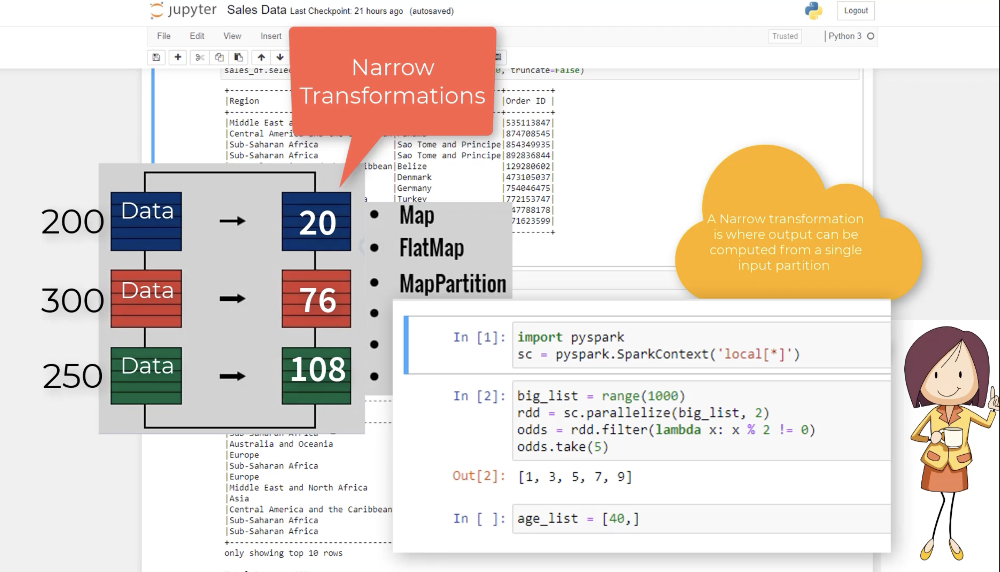
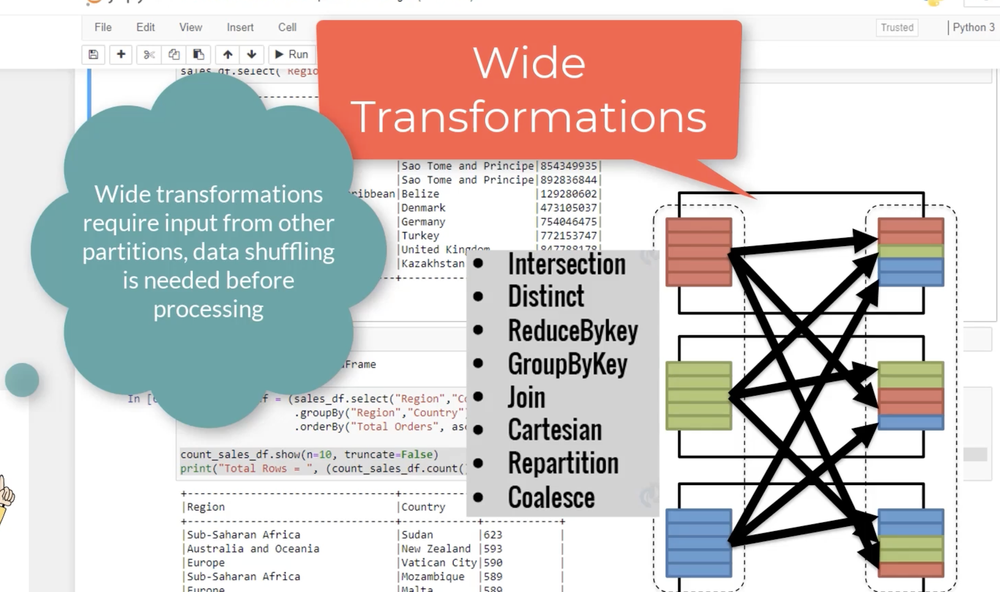

## Chapter 3 RDD

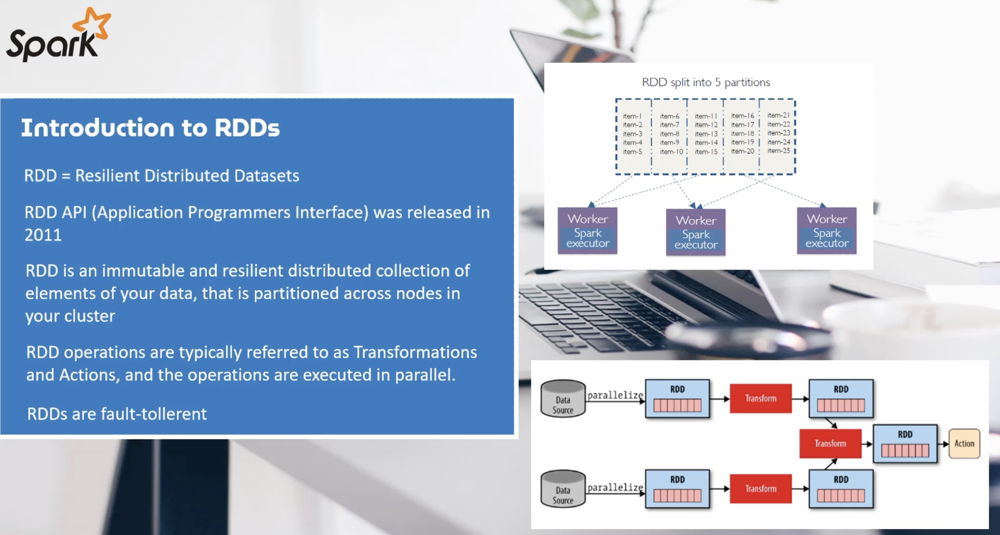
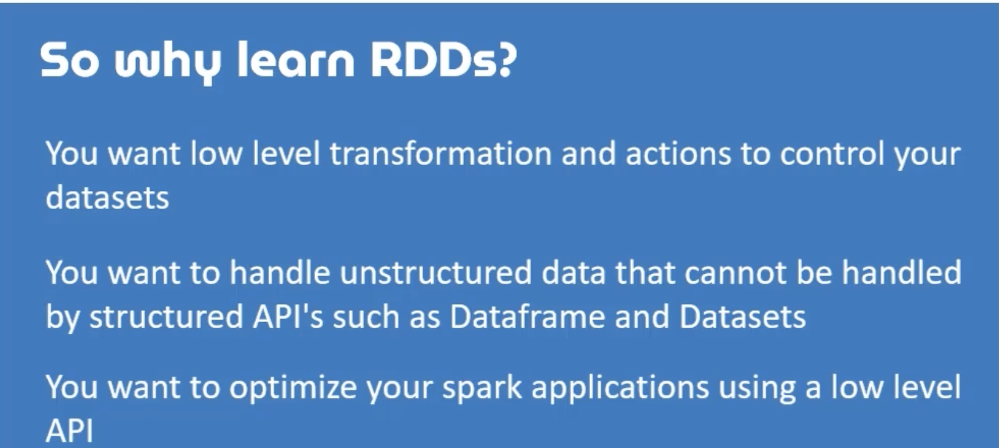

In [6]:
words_list = "Spark makes life a lot easier and put me into good Spirits, Spark is too Awesome!".split(" ")

In [7]:
print(words_list)

['Spark', 'makes', 'life', 'a', 'lot', 'easier', 'and', 'put', 'me', 'into', 'good', 'Spirits,', 'Spark', 'is', 'too', 'Awesome!']


In [8]:
# Put list int RDD
words_rdd = spark.sparkContext.parallelize(words_list)

In [9]:
words_data = words_rdd.collect()

In [10]:
for word in words_data:
    print(word)

Spark
makes
life
a
lot
easier
and
put
me
into
good
Spirits,
Spark
is
too
Awesome!


In [11]:
# Count RDD
words_rdd.count()

16

In [12]:
# Distinct Count
words_rdd.distinct().count()

15

In [13]:
words_unique_rdd = words_rdd.distinct()

for word in words_unique_rdd.collect():
    print(word)

good
makes
life
a
lot
Awesome!
Spark
Spirits,
easier
too
put
and
into
is
me


In [14]:
def wordStartWith(word, letter):
    return word.startswith(letter)

In [15]:
# Filter word start with specific letter
words_rdd.filter(lambda word: wordStartWith(word, "l")).collect()

['life', 'lot']

In [16]:
num_list = [*range(1,21)]
print(num_list)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]


In [17]:
num_rdd = spark.sparkContext.parallelize(num_list)
num_square_rdd = num_rdd.map(lambda n: (n, n * n))

In [18]:
for element in num_square_rdd.collect():
    print(element)

(1, 1)
(2, 4)
(3, 9)
(4, 16)
(5, 25)
(6, 36)
(7, 49)
(8, 64)
(9, 81)
(10, 100)
(11, 121)
(12, 144)
(13, 169)
(14, 196)
(15, 225)
(16, 256)
(17, 289)
(18, 324)
(19, 361)
(20, 400)


In [19]:
words_trd_rdd = words_rdd.map(lambda word: (word, word[0], wordStartWith(word, "S")))
for element in  words_trd_rdd.collect():
    print(element)

('Spark', 'S', True)
('makes', 'm', False)
('life', 'l', False)
('a', 'a', False)
('lot', 'l', False)
('easier', 'e', False)
('and', 'a', False)
('put', 'p', False)
('me', 'm', False)
('into', 'i', False)
('good', 'g', False)
('Spirits,', 'S', True)
('Spark', 'S', True)
('is', 'i', False)
('too', 't', False)
('Awesome!', 'A', False)


In [20]:
# Flatmap flatten all letters
words_rdd.flatMap(lambda word: list(word)).take(20)

['S',
 'p',
 'a',
 'r',
 'k',
 'm',
 'a',
 'k',
 'e',
 's',
 'l',
 'i',
 'f',
 'e',
 'a',
 'l',
 'o',
 't',
 'e',
 'a']

In [21]:
countries_list = [("India",91),("USA",4),("Grace",13)]
countries_rdd = spark.sparkContext.parallelize(countries_list)

In [22]:
# Sort by Key
for country in countries_rdd.sortByKey().collect():
    print(country)

('Grace', 13)
('India', 91)
('USA', 4)


In [23]:
# Reverse Key value and sort descending
for country in countries_rdd.map(lambda c: (c[1],c[0])).sortByKey(False).collect():
    print(country)

(91, 'India')
(13, 'Grace')
(4, 'USA')


In [24]:
num_list = [1, 5, 2, 3, 4]

result = spark.sparkContext.parallelize(num_list).reduce(lambda x, y: x + y)
print(result)

15


In [25]:
# Get max length string
def wordLengthReducer(leftword, rightword):
    if len(leftword) > len(rightword):
        return leftword
    else:
        return rightword


words_rdd.reduce(wordLengthReducer)

'Awesome!'

In [26]:
# Get first element
words_rdd.first()

'Spark'

In [27]:
# Get max value
spark.sparkContext.parallelize(range(1, 10000)).max()

9999